<a href="https://colab.research.google.com/github/govardhan-06/SafeScape/blob/main/ML_tester.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
## Installing the dependencies
!pip install torch torchvision opencv-python

In [2]:
import torch
import torchvision.transforms as T
from torchvision.models.detection import ssdlite320_mobilenet_v3_large
import cv2
import numpy as np

## Person Detection Model Testing (Pre-trained)

In [3]:
model=ssdlite320_mobilenet_v3_large(pretrained=True)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SSDLite320_MobileNet_V3_Large_Weights.COCO_V1`. You can also use `weights=SSDLite320_MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/ssdlite320_mobilenet_v3_large_coco-a79551df.pth" to /root/.cache/torch/hub/checkpoints/ssdlite320_mobilenet_v3_large_coco-a79551df.pth
100%|██████████| 13.4M/13.4M [00:00<00:00, 47.6MB/s]


SSD(
  (backbone): SSDLiteFeatureExtractorMobileNet(
    (features): Sequential(
      (0): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (2): Hardswish()
        )
        (1): InvertedResidual(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
              (1): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
              (2): ReLU(inplace=True)
            )
            (1): Conv2dNormActivation(
              (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (1): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
            )
          )
        )
        (2): Invert

In [4]:
transform=T.Compose([
    T.ToTensor()
])

In [5]:
import requests

# URL of the image
url = "https://cdn.freepixel.com/preview/free-photos-a-group-of-men-and-women-all-dressed-professionally-in-business-suits-standing-together-and-smiling-preview-100398781.jpg"

# Send a GET request to the URL
response = requests.get(url)

# Save the image to a file
with open("image.jpg", "wb") as file:
    file.write(response.content)


In [6]:
from PIL import Image

# Load an image from a directory
image = Image.open("/content/image.jpg")

image_tensor = transform(image).unsqueeze(0)
with torch.no_grad():
    predictions = model(image_tensor)
boxes = predictions[0]['boxes'].cpu().numpy()
labels = predictions[0]['labels'].cpu().numpy()
scores = predictions[0]['scores'].cpu().numpy()

In [7]:
person_boxes = [box for i, box in enumerate(boxes) if labels[i] == 1 and scores[i] > 0.5]
person_boxes

[array([292.11484, 226.15952, 552.3998 , 559.4864 ], dtype=float32),
 array([574.5861, 178.5734, 935.4552, 585.225 ], dtype=float32),
 array([227.80748, 108.26758, 433.73865, 399.86423], dtype=float32),
 array([473.6556 ,  82.25978, 701.88495, 447.875  ], dtype=float32),
 array([ 12.673522, 179.53447 , 303.06006 , 561.571   ], dtype=float32)]

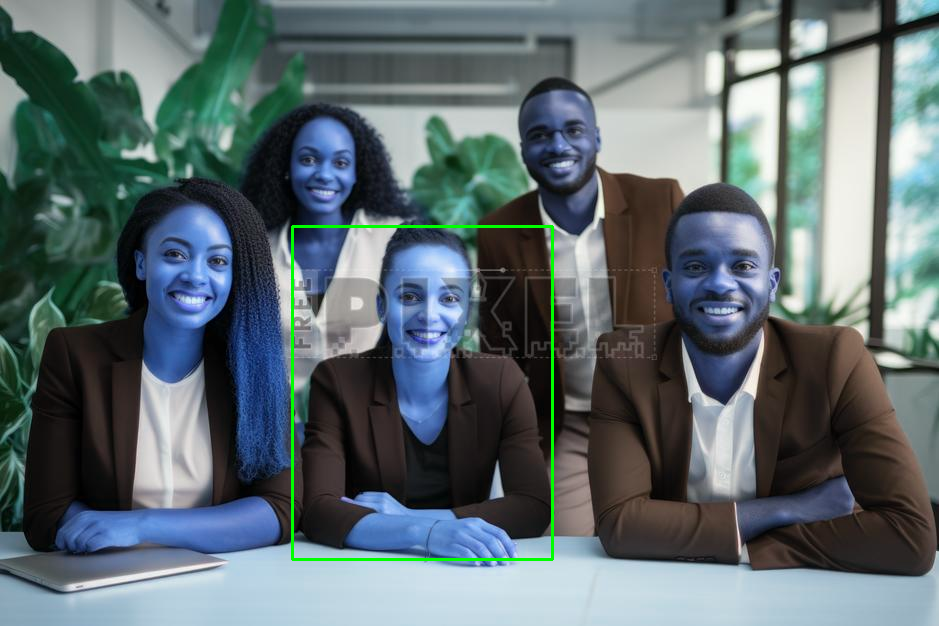

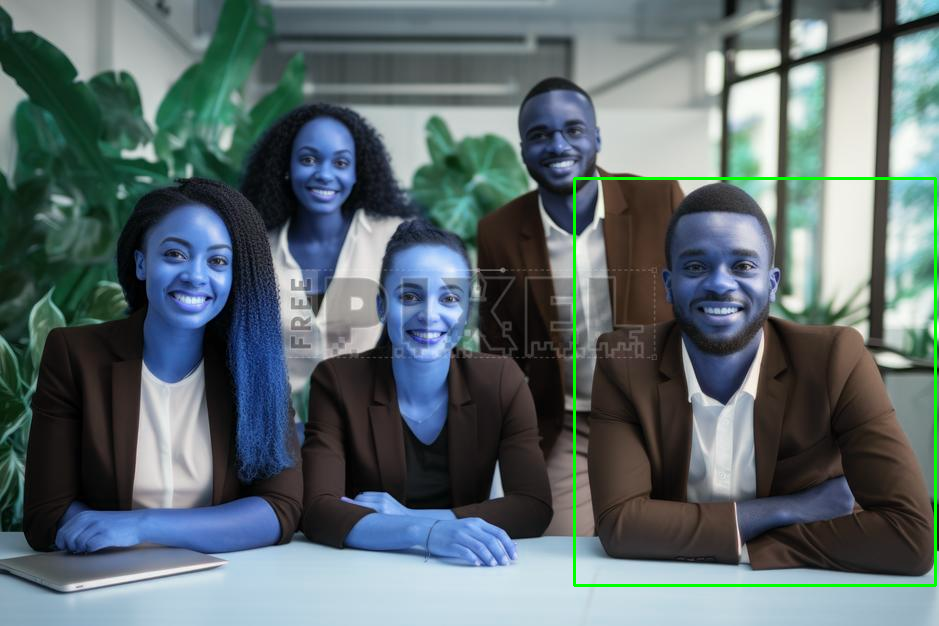

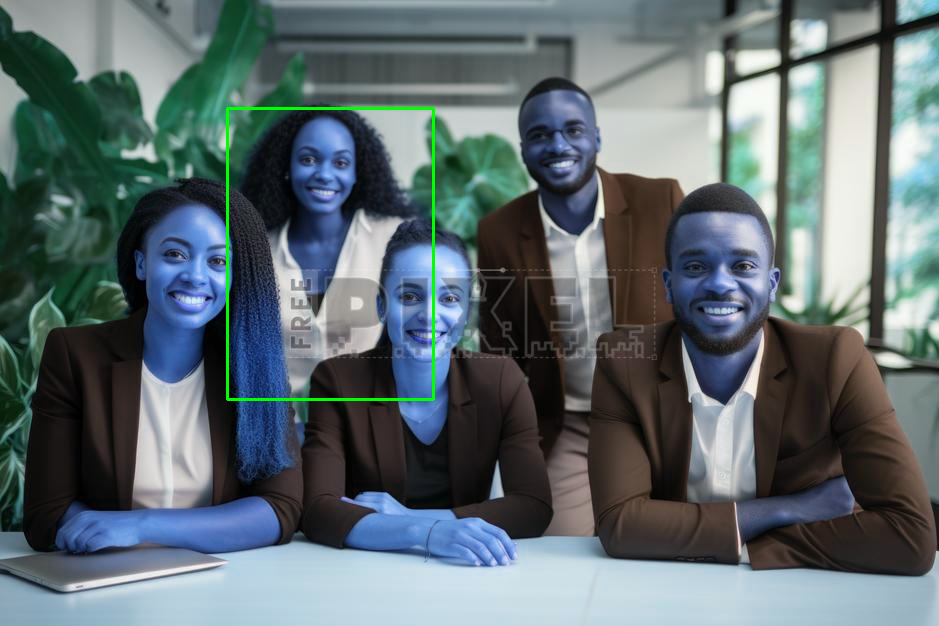

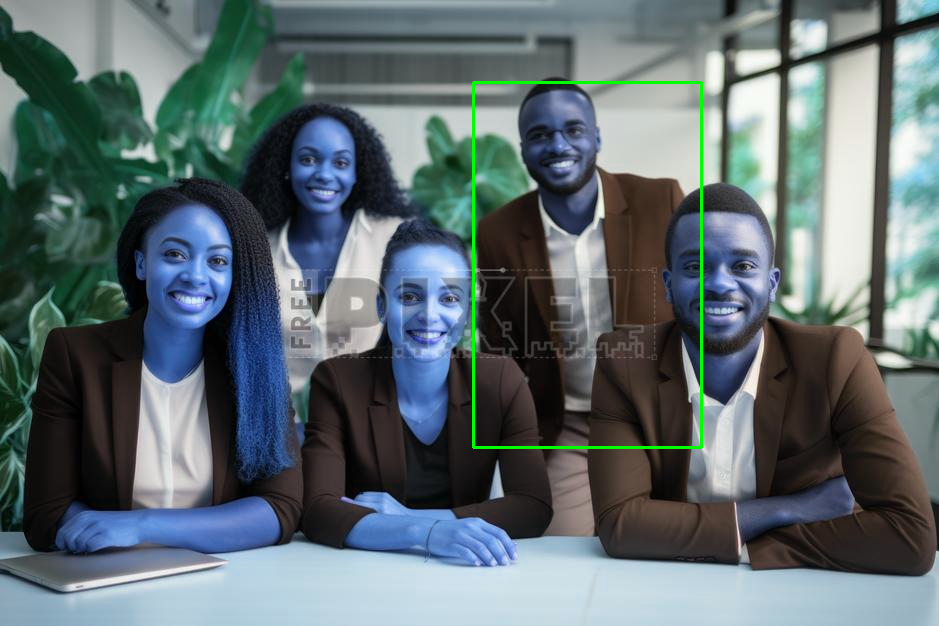

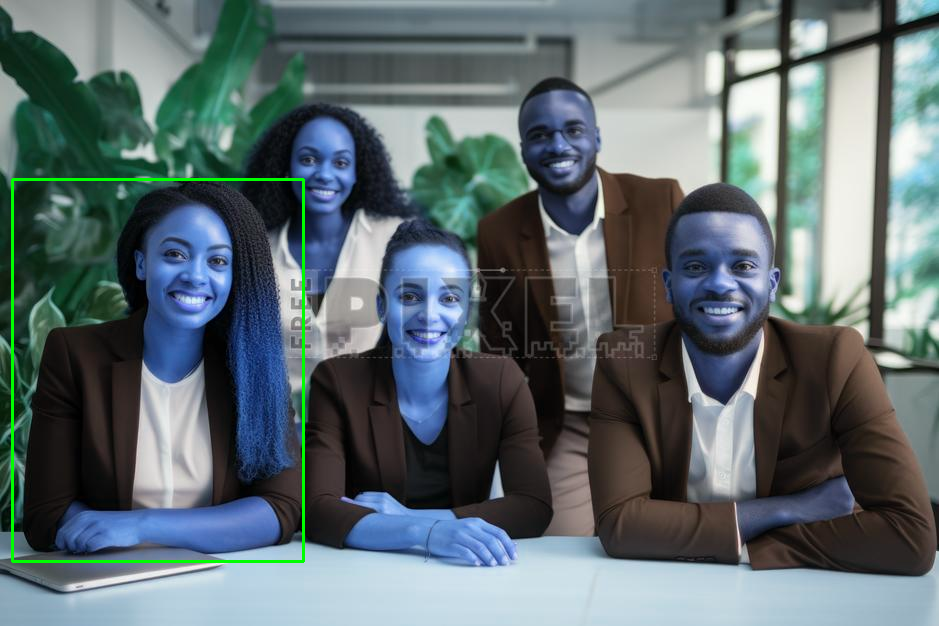

In [8]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image

for box in person_boxes:
    # Convert PIL Image to NumPy array
    image_np = np.array(image)
    cv2.rectangle(image_np, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 255, 0), 2)
    cv2_imshow(image_np)
    cv2.waitKey(0) # Wait for a key press
    cv2.destroyAllWindows() # Close the window

### Image 2

In [13]:
import requests

# URL of the image
url = "https://c7.alamy.com/comp/AD21RE/asb73090-indian-people-standing-in-queue-to-vote-in-india-AD21RE.jpg"

# Send a GET request to the URL
response = requests.get(url)

# Save the image to a file
with open("image.jpg", "wb") as file:
    file.write(response.content)


In [14]:
from PIL import Image

# Load an image from a directory
image = Image.open("/content/image.jpg")

image_tensor = transform(image).unsqueeze(0)
with torch.no_grad():
    predictions = model(image_tensor)
boxes = predictions[0]['boxes'].cpu().numpy()
labels = predictions[0]['labels'].cpu().numpy()
scores = predictions[0]['scores'].cpu().numpy()

In [15]:
predictions

[{'boxes': tensor([[1016.2571,  133.6681, 1216.5144,  796.3426],
          [ 214.7152,  152.8788,  426.8003,  867.8718],
          [ 402.9679,  159.0061,  601.5318,  859.0861],
          ...,
          [ 632.7203,  734.4512,  734.9432,  842.3924],
          [ 257.3543,  400.0099,  294.9574,  436.2062],
          [1157.9801,    8.4265, 1281.1165,  103.0874]]),
  'scores': tensor([0.9960, 0.9788, 0.7958, 0.7603, 0.6661, 0.6103, 0.4229, 0.3189, 0.2775,
          0.2360, 0.2268, 0.1734, 0.1600, 0.1575, 0.1529, 0.1323, 0.1300, 0.1186,
          0.1158, 0.1157, 0.1117, 0.1105, 0.1091, 0.1090, 0.1086, 0.1083, 0.1067,
          0.1066, 0.1046, 0.1037, 0.1009, 0.1008, 0.1000, 0.0998, 0.0997, 0.0982,
          0.0977, 0.0966, 0.0965, 0.0962, 0.0959, 0.0953, 0.0949, 0.0940, 0.0934,
          0.0931, 0.0925, 0.0924, 0.0920, 0.0917, 0.0917, 0.0913, 0.0913, 0.0908,
          0.0907, 0.0900, 0.0898, 0.0896, 0.0894, 0.0893, 0.0891, 0.0883, 0.0883,
          0.0881, 0.0877, 0.0875, 0.0868, 0.0866, 0.08

In [16]:
person_boxes = [box for i, box in enumerate(boxes) if labels[i] == 1 and scores[i] > 0.5]
person_boxes

[array([1016.2571 ,  133.66809, 1216.5144 ,  796.3426 ], dtype=float32),
 array([214.71518, 152.87875, 426.8003 , 867.8718 ], dtype=float32),
 array([402.96786, 159.0061 , 601.5318 , 859.0861 ], dtype=float32),
 array([631.78546, 157.91304, 792.882  , 851.8707 ], dtype=float32),
 array([773.20197, 136.15717, 930.7421 , 839.9044 ], dtype=float32),
 array([  1.8322504, 159.40363  , 190.30861  , 836.2259   ], dtype=float32)]

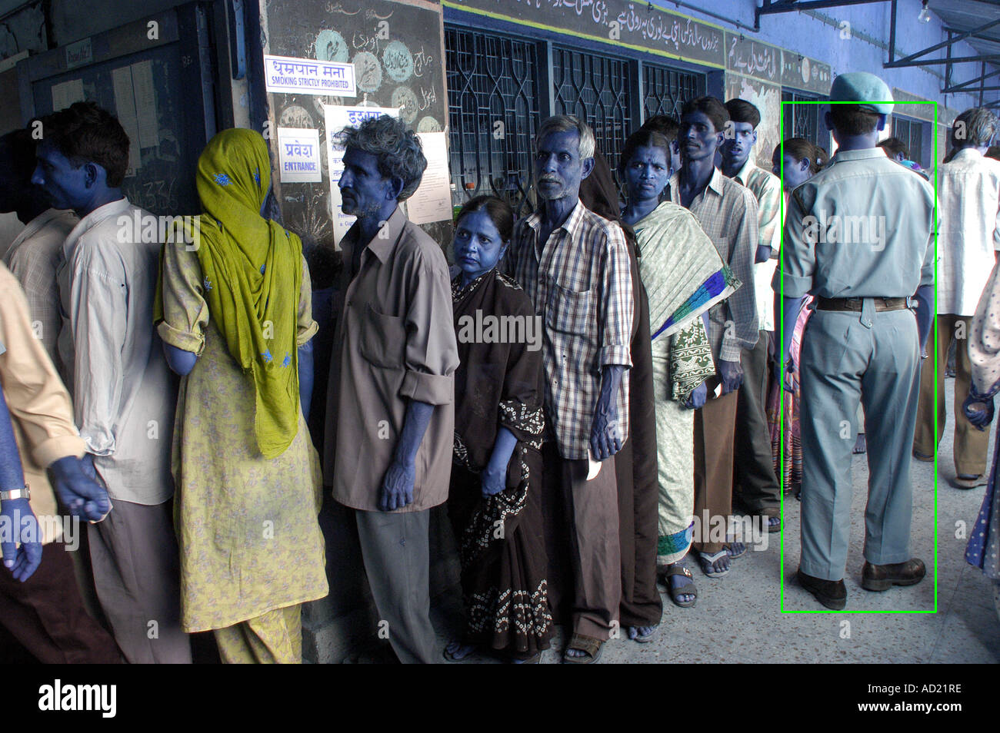

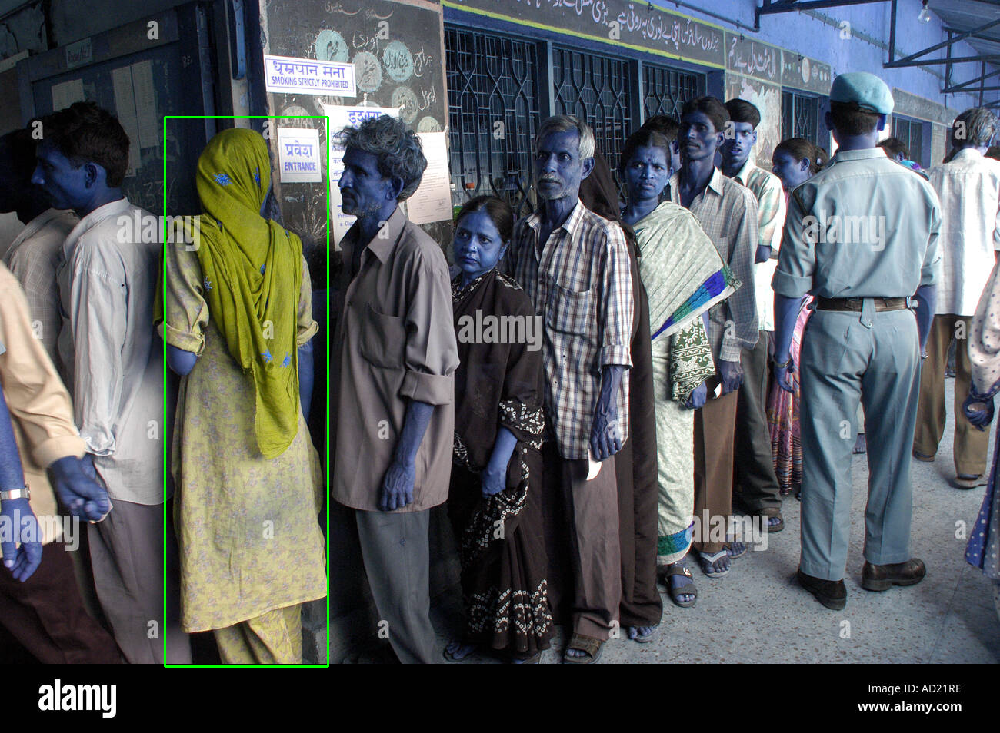

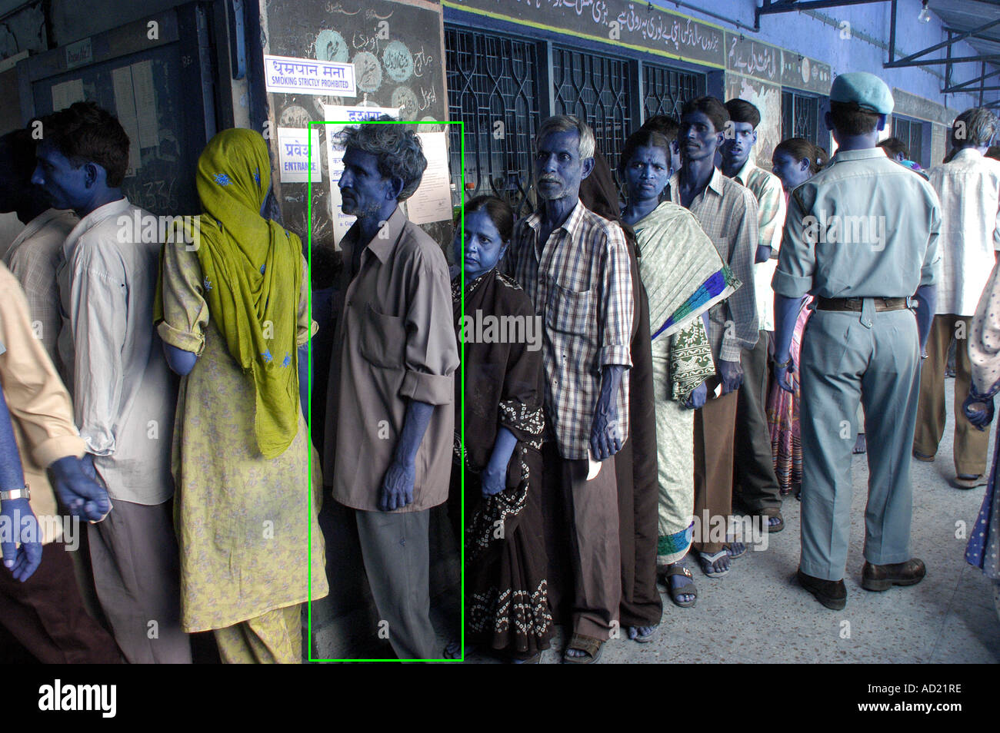

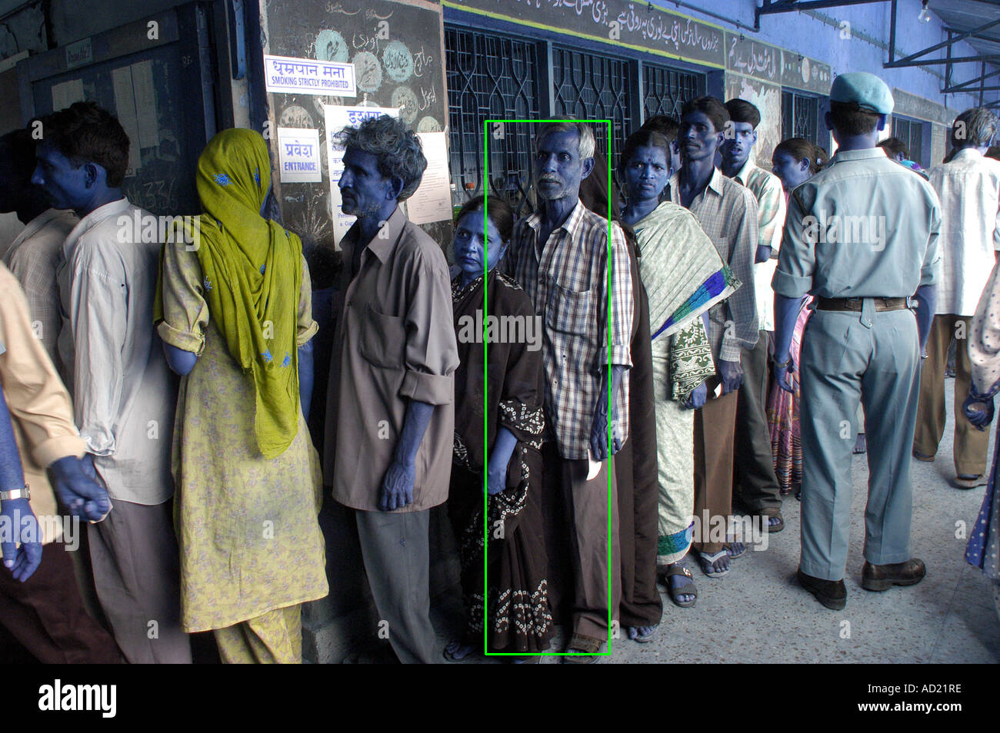

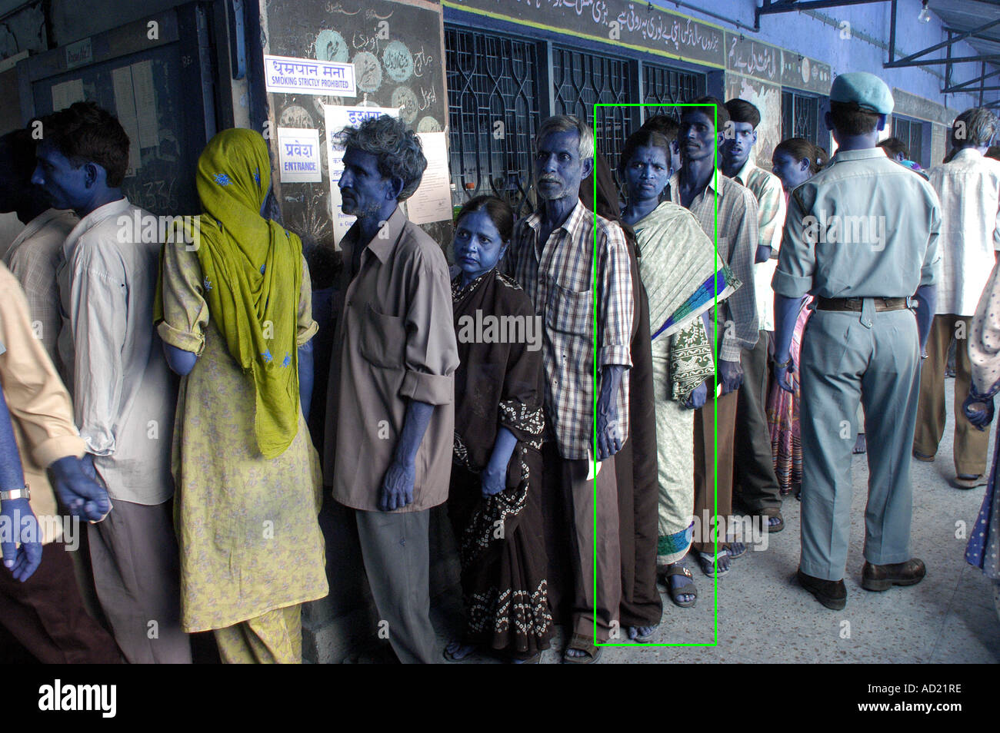

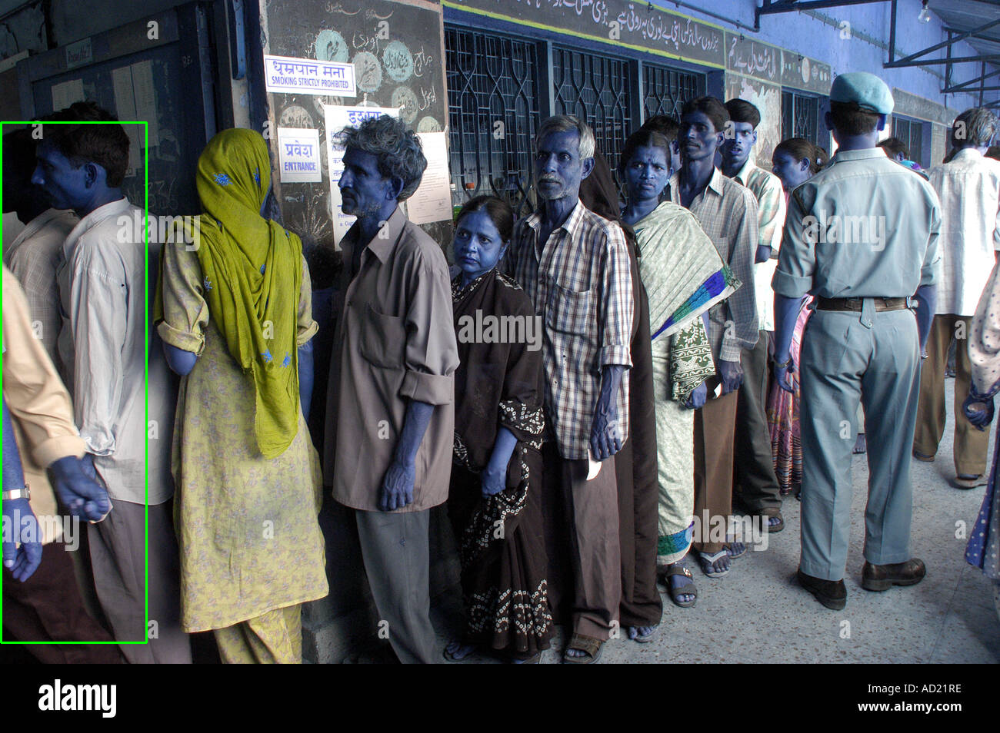

In [17]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image

for box in person_boxes:
    # Convert PIL Image to NumPy array
    image_np = np.array(image)
    cv2.rectangle(image_np, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 255, 0), 2)
    cv2_imshow(image_np)
    cv2.waitKey(0) # Wait for a key press
    cv2.destroyAllWindows() # Close the window